# Basic model

## Implementation

In [54]:
import networkx as nx
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.animation import FuncAnimation
import random
import IPython
from IPython.display import HTML

np.random.seed(123)

class Seller:
    '''
    Seller class in the basic model of the Eras Tour
    '''
    def __init__(self, num_tickets=1):
        '''
        Initialization method
        
        Input:
        
        num_ticket (int):
            The number of tickets of a seller, default to be 1
        '''
        self.num_tickets = num_tickets
        
    def sell(self):
        '''
        Sell method, showing transfer of ticket, ticket goes from 1 to 0
        
        Input:
        
        None
        '''
        if self.num_tickets > 0:
            self.num_tickets -= 1
            return True
        else:
            return False
        
class Buyer:
    '''
    Buyer class in the basic model of the Eras Tour
    '''
    def __init__(self, num_tickets=0):
        '''
        Initialization method
        
        Input:
        
        num_ticket (int):
            The number of tickets of a buyer, default to be 0
        '''
        self.num_tickets = num_tickets
        
    def buy(self):
        '''
        Sell method
        
        Input:
        
        None
        '''
        self.num_tickets += 1
        
class ErasTourBasic:
    '''
    Class showing the basic simulation of the Eras Tour, with major oversimplifications
    '''
    def __init__(self, demand_prob, transaction_prob, nodes_num=22, k=2, p=0.2, num_steps=100):
        '''
        Initialization method for the class
        
        Inputs:
        
        demand_prob : float
            The probabiity of demand, or edge connection
        
        transaction_prob : float
            The probability of a successful transaction, or edge deletion
            
        nodes_num : int
            The number of Swifties in the simulation
            
        k : int
            Number of nearest neighbors in the Watts-Strogatz simulation
            
        p : float
            Probability of rewiring in the algorithm
            
        num_steps : int
            Number of steps in the simulation
        '''
        self.demand_prob = demand_prob
        self.transaction_prob = transaction_prob
        self.nodes_num = nodes_num
        self.k = k
        self.p = p
        self.graph = nx.watts_strogatz_graph(self.nodes_num, self.k, self.p)
        self.num_steps = num_steps
        
        # Random initialization of buyers and sellers in the system
        for node in self.graph.nodes:
            node_type = random.choice(['buyer', 'seller'])
            if node_type == 'buyer':
                buyer = Buyer()
                self.graph.nodes[node]['type'] = 'buyer'
                self.graph.nodes[node]['obj'] = buyer
            else:
                seller = Seller()
                self.graph.nodes[node]['type'] = 'seller'
                self.graph.nodes[node]['obj'] = seller
        
    def update(self):
        '''
        Update the complex system based on the rules of the basic model:
        random edge connection, random transaction & edge deletion
        '''
        for node in self.graph.nodes:
            if np.random.random() < self.demand_prob:
                neighbors = list(self.graph.neighbors(node))
                for neighbor in neighbors:
                    if np.random.random() < self.transaction_prob:
                        # check for roles
                        if ((self.graph.nodes[node]['type'] == 'buyer' and self.graph.nodes[neighbor]['type'] == 'seller') or
                            (self.graph.nodes[node]['type'] == 'seller' and self.graph.nodes[neighbor]['type'] == 'buyer')):
                            
                            # Swap roles to represent transaction
                            self.graph.nodes[node]['type'], self.graph.nodes[neighbor]['type'] = \
                            self.graph.nodes[neighbor]['type'], self.graph.nodes[node]['type']

                            # Remove edge after transaction
                            self.graph.remove_edge(node, neighbor)

                
                # add new edge
                for i in range(self.nodes_num):
                    for j in range(i + 1, self.nodes_num):
                        if random.random() < self.p:
                            self.graph.add_edge(i, j)

## Visualization

In [55]:
def get_network_statistics(graph):
    '''
    Obtain relevant network statistics, taking the graph as the input
    '''
    # Calculating the average degree
    total_degree = sum(dict(graph.degree()).values())
    average_degree = total_degree / graph.number_of_nodes()

    # Counting sellers and buyers
    num_sellers = sum(1 for _, node_data in graph.nodes(data=True) if node_data['type'] == 'seller')
    num_buyers = sum(1 for _, node_data in graph.nodes(data=True) if node_data['type'] == 'buyer')

    return average_degree, num_sellers, num_buyers

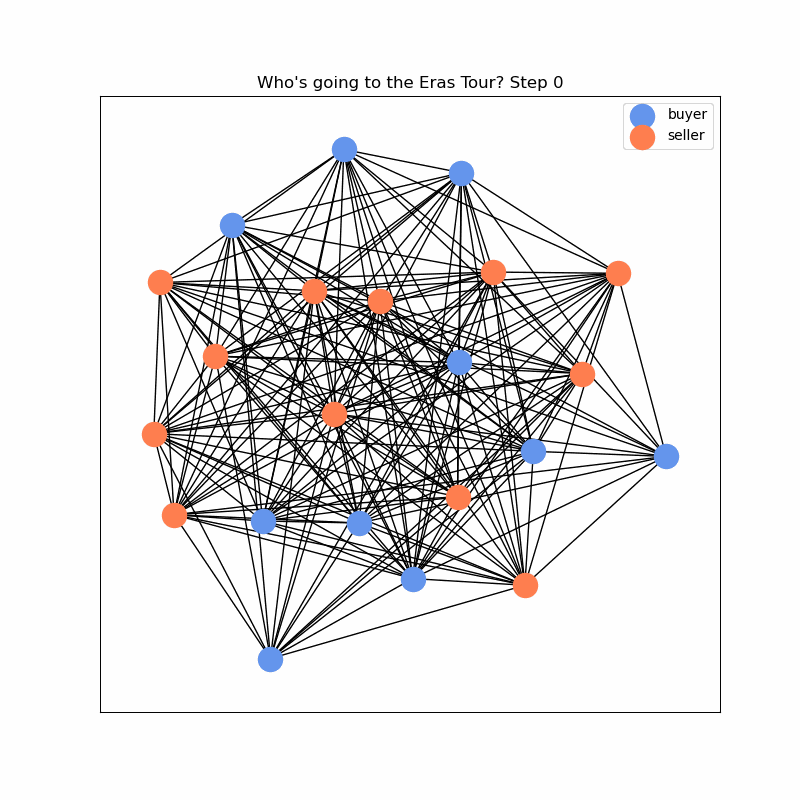

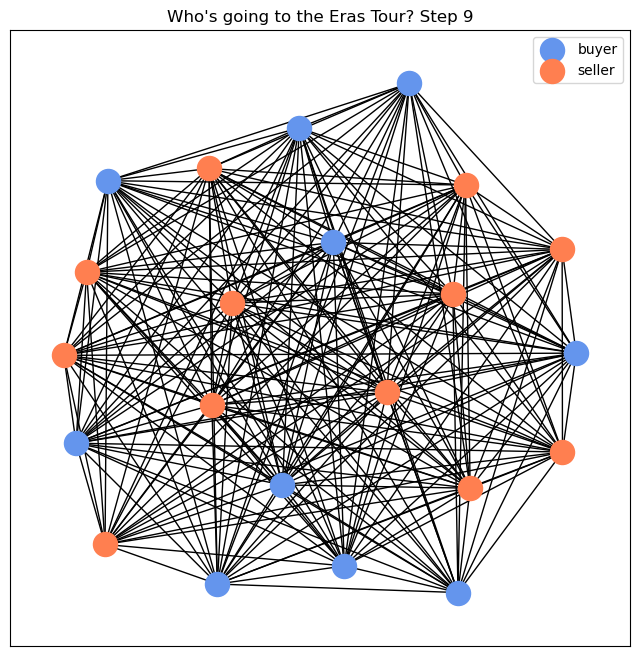

In [57]:
def visualize_network(graph, step):
    '''
    Visualize the network using NetworkX's library functions
    taking graph and step of the simulation as inputs
    and returns a plot
    '''
    pos = nx.spring_layout(graph)
    plt.clf()
    plt.title(f"Who's going to the Eras Tour? Step {step}")

    buyer_nodes = [node for node, data in graph.nodes(data=True) if data['type'] == 'buyer']
    seller_nodes = [node for node, data in graph.nodes(data=True) if data['type'] == 'seller']

    nx.draw_networkx_nodes(graph, pos, nodelist=buyer_nodes, node_color='cornflowerblue', label='buyer')
    nx.draw_networkx_nodes(graph, pos, nodelist=seller_nodes, node_color='coral', label='seller')
    nx.draw_networkx_edges(graph, pos)
    plt.legend()

def update(step, eras_tour):
    '''
    Update function for the visualization
    '''
    eras_tour.update()
    visualize_network(eras_tour.graph, step)

def run_simulation(demand_prob, transaction_prob, num_steps):
    '''
    Running the simulation, taking the model inputs as inputs for visualization
    '''
    eras_tour = ErasTourBasic(demand_prob, transaction_prob)

    fig, _ = plt.subplots(figsize=(8, 8))
    ani = FuncAnimation(fig, lambda step: update(step, eras_tour), frames=num_steps, repeat=False)

    # Save the animation as a GIF
    ani.save('simulation.gif', writer='pillow')

    # If using Jupyter Notebook, display the GIF
    from IPython.display import Image
    return Image(filename='simulation.gif')

# Example usage
demand_probability = 0.1
transaction_probability = 0.2
num_simulation_steps = 10

image = run_simulation(demand_probability, transaction_probability, num_simulation_steps)
image

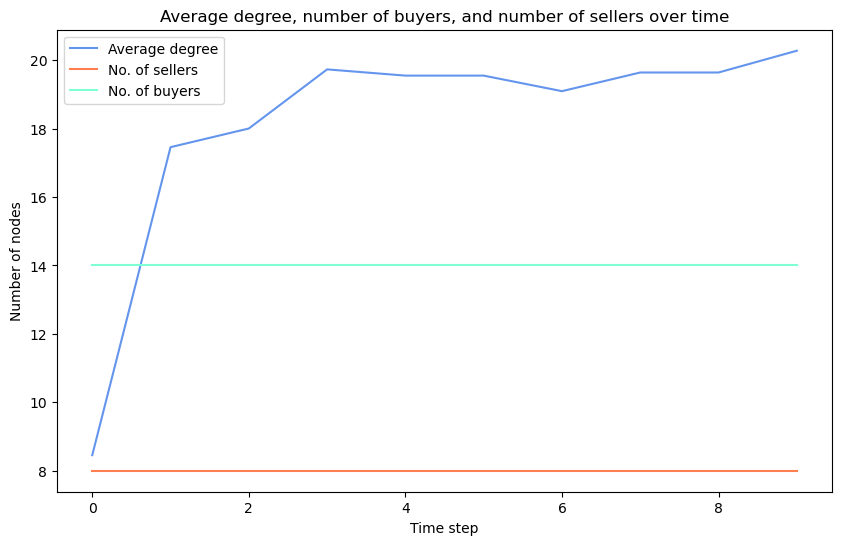

In [39]:
def run_simulation_plot_over_time(demand_prob, transaction_prob, num_steps):
    '''
    Running the simulation over different time steps,
    taking in model parameters as inputs
    returning a matplotlib figure as output
    '''
    eras_tour = ErasTourBasic(demand_prob, transaction_prob)

    avg_degrees = []
    num_sellers_list = []
    num_buyers_list = []

    for step in range(num_steps):
        eras_tour.update()
        avg_degree, num_sellers, num_buyers = get_network_statistics(eras_tour.graph)
        
        avg_degrees.append(avg_degree)
        num_sellers_list.append(num_sellers)
        num_buyers_list.append(num_buyers)

    return avg_degrees, num_sellers_list, num_buyers_list

# Apply this to given parameters and plto
demand_probability = 0.2
transaction_probability = 0.4
num_simulation_steps = 10

avg_degrees, num_sellers_list, num_buyers_list = run_simulation_plot_over_time(demand_probability, transaction_probability, num_simulation_steps)

plt.figure(figsize=(10, 6))
plt.plot(avg_degrees, label='Average degree', color='cornflowerblue')
plt.plot(num_sellers_list, label='No. of sellers', color='coral')
plt.plot(num_buyers_list, label='No. of buyers', color='aquamarine')
plt.xlabel('Time step')
plt.ylabel('Number of nodes')
plt.title('Average degree, number of buyers, and number of sellers over time')
plt.legend()
plt.show()

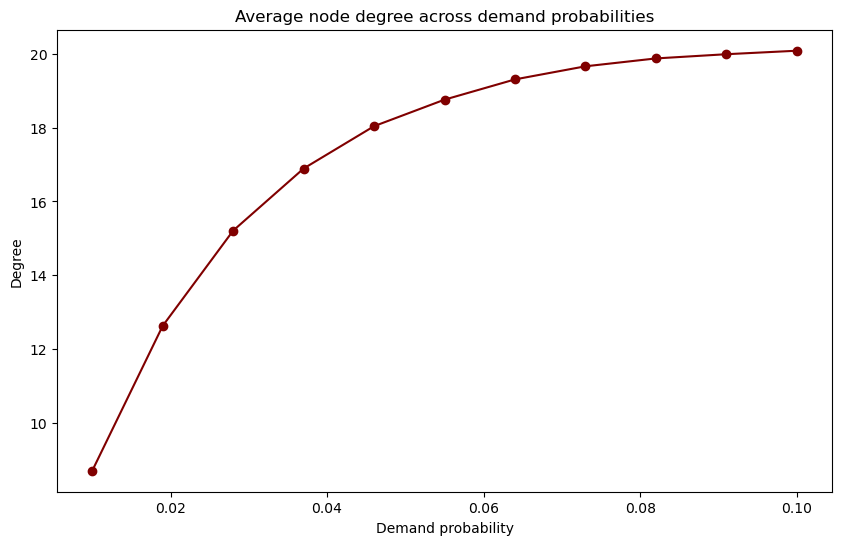

In [37]:
def plot_simulation_probs(demand_prob, transaction_prob, num_steps):
    '''
    Running the simulation over different demand probabilities,
    taking in model parameters as inputs
    returning a matplotlib figure as output
    '''
    eras_tour = ErasTourBasic(demand_prob, transaction_prob)

    avg_degrees = []

    for step in range(num_steps):
        eras_tour.update()
        avg_degree, _, _ = get_network_statistics(eras_tour.graph)
        avg_degrees.append(avg_degree)

    # Return the average degree of the last time step
    return avg_degrees[-1]

# setting parameters
transaction_probability = 0.2
num_simulation_steps = 10
demand_probabilities = np.linspace(0.01, 0.1, 11)  
num_runs = 1000  

final_avg_degrees = []

for demand_prob in demand_probabilities:
    sum_avg_degree = 0
    for _ in range(num_runs):
        sum_avg_degree += plot_simulation_probs(demand_prob, transaction_probability, num_simulation_steps)
    avg_degree = sum_avg_degree / num_runs
    final_avg_degrees.append(avg_degree)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(demand_probabilities, final_avg_degrees, marker='o', color="maroon") #tribute to "Maroon" by Taylor Swift
plt.xlabel('Demand probability')
plt.ylabel('Degree')
plt.title('Average node degree across demand probabilities')
plt.show()

# Complex Model

## Implementation

In [70]:
from scipy import stats as sts
from matplotlib import colors as mcolors
        
class Swiftie:
    '''
    A common name for an individual participating in the second-hand market
    '''
    def __init__(self, num_tickets, money_owned):
        '''
        Initialization method with inputs
        
        num_tickets (int):
            Number of tickets owned by a Swiftie, ranging from 0 to 4
            
        money_owned (float):
            Money that they prepared beforehand to purchase the tickets
            
        '''
        self.num_tickets = num_tickets
        self.money_owned = money_owned
        
    def buy(self, num_tickets_bought, cost):
        '''
        Method to buy The Eras Tour ticket with inputs
        
        num_tickets_bought (int):
            Number of tickets bought, ranging from 0 to 4
            
        cost (float):
            Money spent
        '''
        self.num_tickets += num_tickets_bought
        self.money_owned -= cost
        
    def sell(self, num_tickets_sold, price):
        '''
        Method to buy The Eras Tour ticket with inputs
        
        num_tickets_bought (int):
            Number of tickets bought, ranging from 0 to 4
            
        cost (float):
            Money spent
        '''
        self.num_tickets -= num_tickets_sold
        self.money_owned += price
        
        
class ErasTourBuenosAires:
    '''
    Buenos Aires, simplified into just a network
    of buyers and sellers for the Taylor Swift ticket tour
    '''
    def __init__(self, demand_prob, transaction_prob, nodes_num, k, p, num_steps, 
                popularity, money_distribution, price_distribution):
        '''
        Initialization method of the class, which includes the following
        parameters 
        - demand_prob (float): probability of having a connection between a seller node and a buyer node
        - transaction_prob (float): probability of having a successful transaction
        - nodes_num (float): number of people in the simulation market
        - popularity (float): popularity of the concert, dynamic over time steps
        - k, p: parameters for the graph
        - num_steps: number of steps in the simulator
        - popularity: the popularity index of the Eras Tour
        '''
        
    
        self.demand_prob = demand_prob
        self.transaction_prob = transaction_prob
        self.nodes_num = nodes_num
        self.k = k
        self.p = p
        self.graph = nx.watts_strogatz_graph(self.nodes_num, self.k, self.p)
        self.num_steps = num_steps
        self.popularity = popularity
        self.price_distribution = price_distribution
        self.money_distribution = money_distribution
        
        for node in self.graph.nodes:
            num_tickets = random.randint(0, 4)  # Random number of tickets from 0 to 4
            money_owned = self.money_distribution.rvs()  # Random amount of money from the price distribution
            swiftie = Swiftie(num_tickets, money_owned)
            self.graph.nodes[node]['obj'] = swiftie
        
        
    def observe(self):
        '''
        Observe the network and its changes, drawing out the change
        
        Inputs: 
        None
        
        Returns:
        matplotlib figure, showing network diagram after a certain number of time steps
        '''
        pos = nx.spring_layout(self.graph)
        ticket_counts = [self.graph.nodes[node]['obj'].num_tickets for node in self.graph.nodes]
        
        # Normalize ticket counts manually for node colors
        ticket_colors = [i / 4 for i in ticket_counts]  # Normalized from 0 to 1

        # Define a colormap 
        cmap = plt.cm.Reds  # Red (Taylor's Version)
        nx.draw(self.graph, pos, node_color=ticket_colors, cmap=cmap, with_labels=True)

        # Create a colorbar with the specified tick marks
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=4))
        sm.set_array([])
        cbar = plt.colorbar(sm, ticks=[0, 1, 2, 3, 4])
        cbar.set_label('Number of Tickets')
        plt.title("Number of Tickets Held by Swifties")
        
    def update(self):
        '''
        Update the Eras Tour network based on rules of the complex model
        including environment parameters and price
        
        Inputs:
        None
        
        Returns:
        None
        '''
        self.popularity += 0.01 # increment this growth rate daily
        for node in self.graph.nodes:
            # Update demand probability
            self.demand_prob += self.popularity

            if np.random.random() < self.demand_prob:
                neighbors = list(self.graph.neighbors(node))
                if neighbors:
                    # Randomly select a neighbor for potential transaction
                    neighbor = random.choice(neighbors)

                    # Determine transaction price
                    price = self.price_distribution.rvs()

                    # Update transaction probability
                    self.transaction_prob += (-0.001 * price + self.popularity)

                    swiftie = self.graph.nodes[node]['obj']
                    neighbor_swiftie = self.graph.nodes[neighbor]['obj']

                    # Execute transaction based on Swifties' current state
                    if np.random.random() < self.transaction_prob:
                        if swiftie.num_tickets < 4 and swiftie.money_owned >= price:
                            # Swiftie buys a ticket from neighbor
                            swiftie.buy(1, price)
                            neighbor_swiftie.sell(1, price)
                        elif neighbor_swiftie.num_tickets < 4 and neighbor_swiftie.money_owned >= price:
                            # Neighbor buys a ticket from Swiftie
                            neighbor_swiftie.buy(1, price)
                            swiftie.sell(1, price)

                # Adding new edges logic
                for i in range(self.nodes_num):
                    for j in range(i + 1, self.nodes_num):
                        if random.random() < self.p:
                            self.graph.add_edge(i, j)
        
    def visualize_network(self):
        '''
        Visualize the network but now with the money remaining included,
        takes no input and returns a matplotlib figure as output
        '''
        pos = nx.spring_layout(self.graph)  

        # Get the number of tickets and money owned for each Swiftie
        ticket_counts = [node['obj'].num_tickets for node in self.graph.nodes.values()]
        money_owned = [node['obj'].money_owned for node in self.graph.nodes.values()]

        ticket_norm = [i / max(ticket_counts) for i in ticket_counts] if max(ticket_counts) > 0 else ticket_counts
        money_norm = [i / max(money_owned) for i in money_owned] if max(money_owned) > 0 else money_owned

        plt.figure(figsize=(12, 6))

        # Visualize the number of tickets
        plt.subplot(1, 2, 1)
        ticket_cmap = plt.cm.Reds
        nx.draw(self.graph, pos, node_color=ticket_norm, cmap=ticket_cmap, with_labels=True)
        plt.colorbar(plt.cm.ScalarMappable(cmap=ticket_cmap), label='Number of Tickets')
        plt.title('Number of Tickets per Swiftie')

        # Visualize the amount of money
        plt.subplot(1, 2, 2)
        money_cmap = plt.cm.Greens
        nx.draw(self.graph, pos, node_color=money_norm, cmap=money_cmap, with_labels=True)
        plt.colorbar(plt.cm.ScalarMappable(cmap=money_cmap), label='Amount of Money Owned')
        plt.title('Amount of Money Owned by Swifties')

        plt.show()
        

## Visualization

/var/folders/qj/8nxz3v4j27gdnxfv09x9zrk40000gn/T/ipykernel_25675/3078796846.py:148: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, ticks=[0, 1, 2, 3, 4])


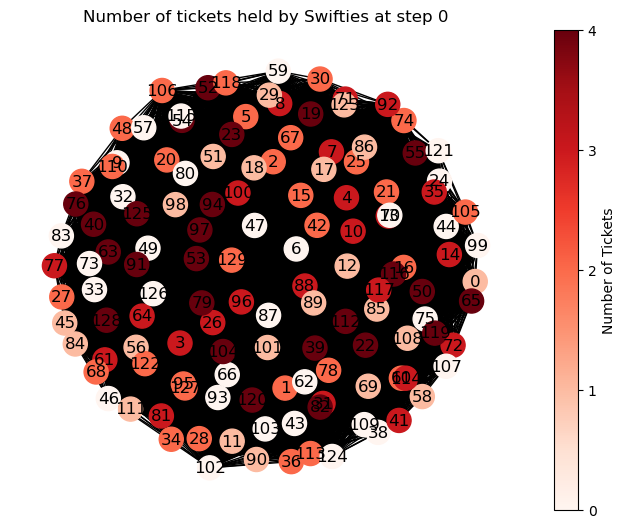

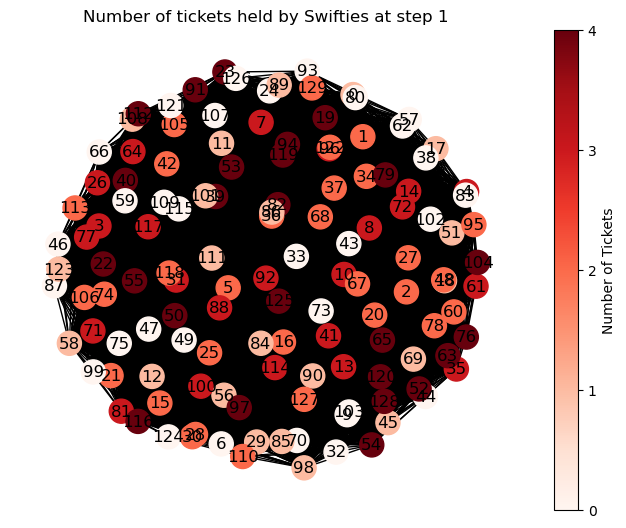

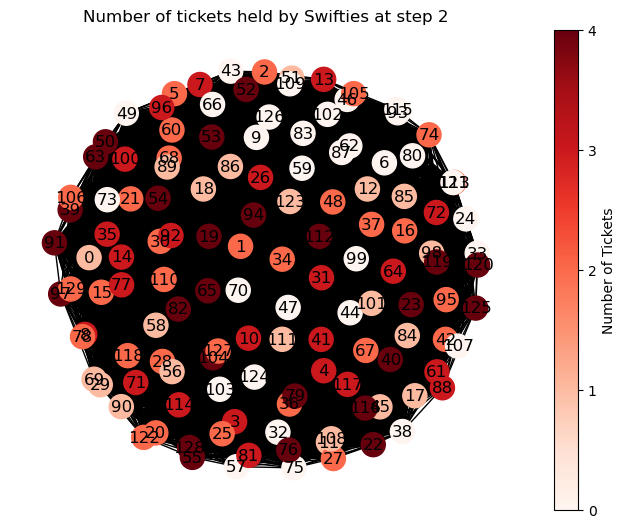

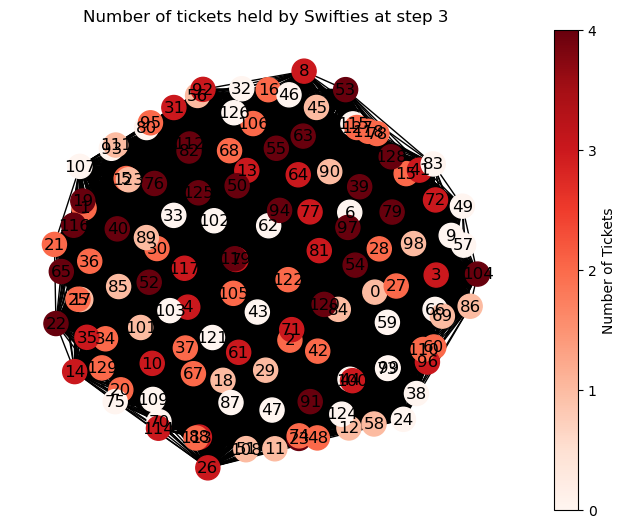

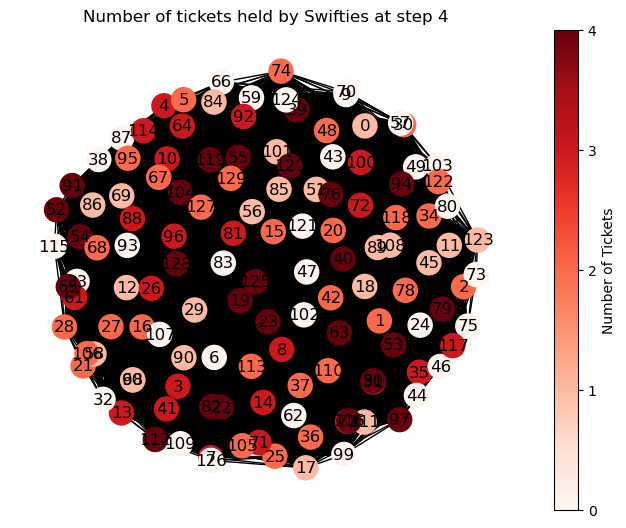

...

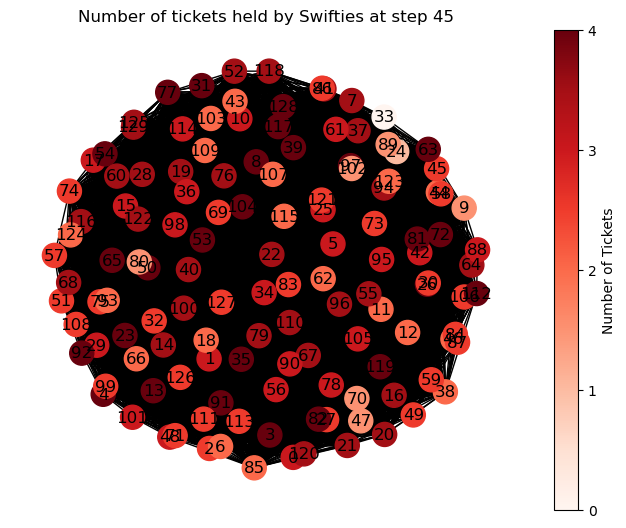

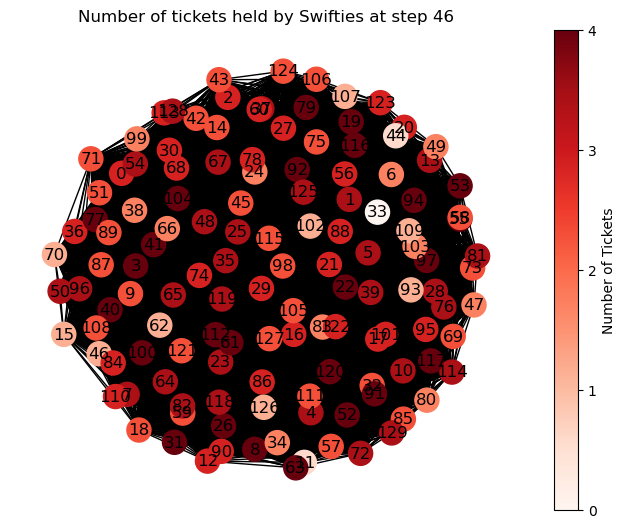

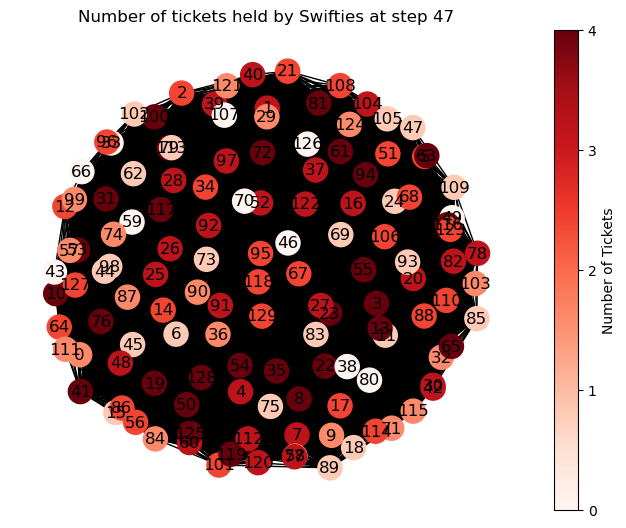

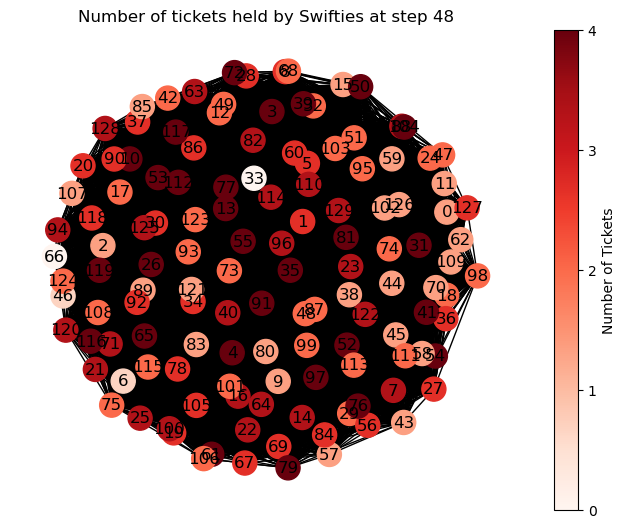

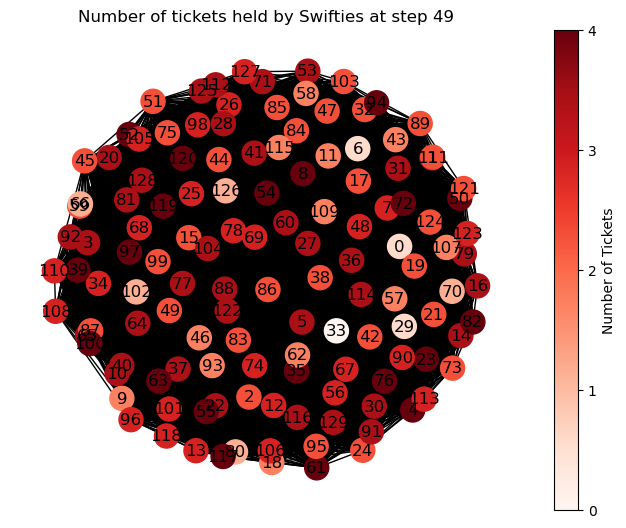

In [45]:
def run_simulation_complex(demand_prob, transaction_prob, nodes_num, k, p, num_steps, 
                popularity, price_distribution, money_distribution):
    '''
    Function to run the simulation,
    taking the model parameters as inputs 
    and return a matplotlib figure showing simulation results
    '''
    
    eras_tour = ErasTourBuenosAires(demand_prob, transaction_prob, nodes_num, k, p, num_steps, 
                popularity, price_distribution, money_distribution)
    
    
    
    for step in range(num_steps):
        eras_tour.update()
        eras_tour.observe()
        plt.title(f"Number of tickets held by Swifties at step {step}")
        plt.show()

# Apply to model parameters
demand_probability = 0.05
transaction_probability = 0.3
num_simulation_steps = 50
nodes_num = 130
k = 2
p = 0.2
popularity_index = 0.05
price_distribution = sts.norm(loc=200, scale=5)
money_distribution = sts.norm(loc=190, scale=10)

image = run_simulation_complex(demand_probability, transaction_probability,
                      nodes_num, k, p, num_simulation_steps, popularity_index, price_distribution, money_distribution)
image


/var/folders/qj/8nxz3v4j27gdnxfv09x9zrk40000gn/T/ipykernel_25675/3078796846.py:210: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(plt.cm.ScalarMappable(cmap=ticket_cmap), label='Number of Tickets')
/var/folders/qj/8nxz3v4j27gdnxfv09x9zrk40000gn/T/ipykernel_25675/3078796846.py:217: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(plt.cm.ScalarMappable(cmap=money_cmap), label='Amount of Money Owned')


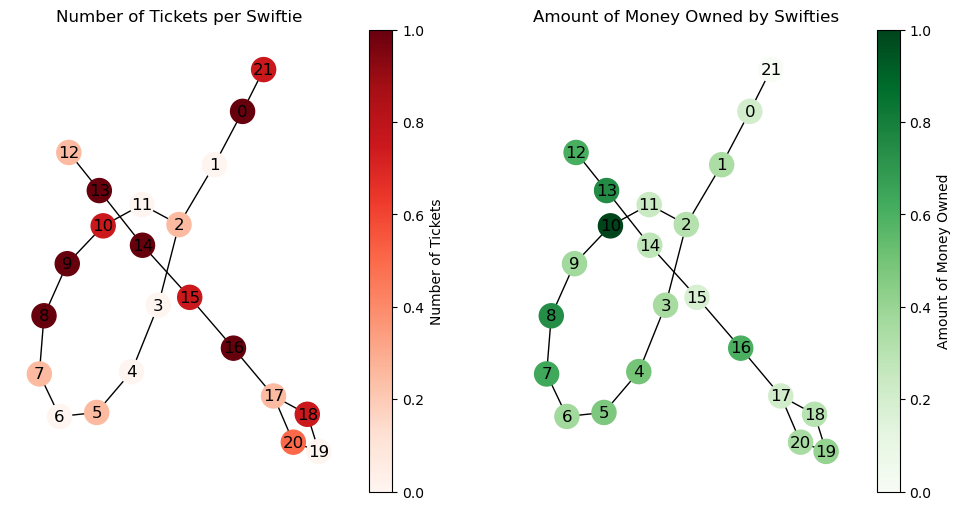

In [46]:
# Apply to model parameters

demand_probability = 0.05
transaction_probability = 0.3
num_simulation_steps = 50
nodes_num = 22
k = 2
p = 0.2
popularity_index = 0.05
price_distribution = sts.norm(loc=200, scale=5)
money_distribution = sts.norm(loc=190, scale=10)

eras_tour = ErasTourBuenosAires(demand_probability, transaction_probability, nodes_num, k, p, num_simulation_steps, popularity_index, money_distribution, price_distribution)
eras_tour.visualize_network()

Repeating the simulation multiple times

In [49]:
def run_taylor_swift_multiple_times(demand_prob, transaction_prob, nodes_num, k, p, num_steps, popularity, money_distribution, price_distribution, num_trials):
    total_tickets = np.zeros(nodes_num)
    total_money = np.zeros(nodes_num)

    for _ in range(num_trials):
        eras_tour = ErasTourBuenosAires(demand_prob, transaction_prob, nodes_num, k, p, num_steps, popularity, money_distribution, price_distribution)
        for step in range(num_steps):
            eras_tour.update()

        for i, node in enumerate(eras_tour.graph.nodes.values()):
            total_tickets[i] += node['obj'].num_tickets
            total_money[i] += node['obj'].money_owned

    # Calculate averages
    avg_tickets = total_tickets / num_trials
    avg_money = total_money / num_trials

    return avg_tickets, avg_money

/var/folders/qj/8nxz3v4j27gdnxfv09x9zrk40000gn/T/ipykernel_25675/3077794417.py:10: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(plt.cm.ScalarMappable(cmap=ticket_cmap), label='Average number of tickets')
/var/folders/qj/8nxz3v4j27gdnxfv09x9zrk40000gn/T/ipykernel_25675/3077794417.py:17: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(plt.cm.ScalarMappable(cmap=money_cmap), label='Average amount of money left')


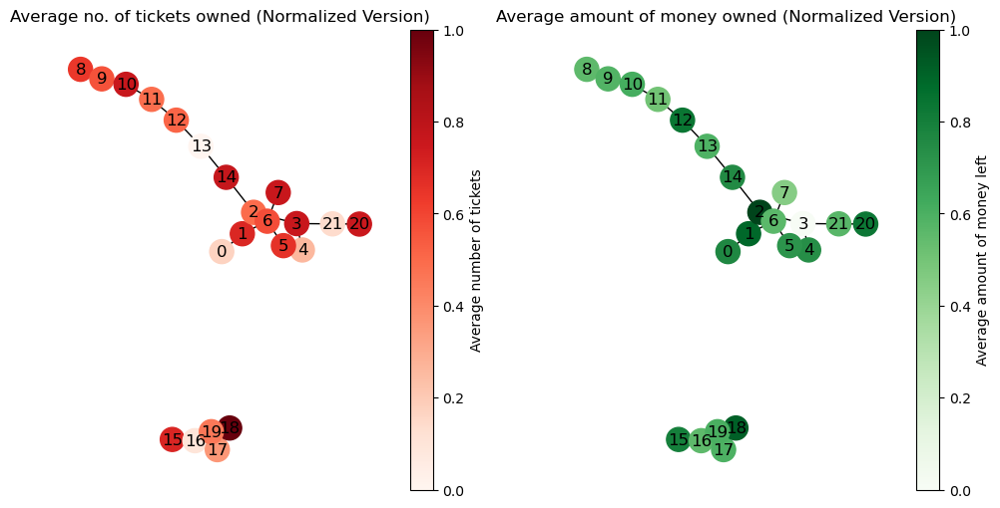

In [58]:
def visualize_network_averages(graph, avg_tickets, avg_money):
    '''
    Visualize the results of the complex Eras Tour simulation
    after multiple trials
    '''
    pos = nx.spring_layout(graph)

    plt.figure(figsize=(12, 6))

    # Visualize the average number of tickets
    plt.subplot(1, 2, 1)
    ticket_cmap = plt.cm.Reds
    nx.draw(graph, pos, node_color=avg_tickets, cmap=ticket_cmap, with_labels=True)
    plt.colorbar(plt.cm.ScalarMappable(cmap=ticket_cmap), label='Average number of tickets')
    plt.title('Average no. of tickets owned (Normalized Version)')

    # Visualize the average amount of money
    plt.subplot(1, 2, 2)
    money_cmap = plt.cm.Greens
    nx.draw(graph, pos, node_color=avg_money, cmap=money_cmap, with_labels=True)
    plt.colorbar(plt.cm.ScalarMappable(cmap=money_cmap), label='Average amount of money left')
    plt.title('Average amount of money owned (Normalized Version)')

    plt.show()

demand_probability = 0.1
transaction_probability = 0.2
nodes_num = 22
k = 2
p = 0.2
num_steps = 10
popularity_index = 0.05
price_distribution = sts.norm(loc=200, scale=5)
money_distribution = sts.norm(loc=190, scale=10)
num_trials = 1000

avg_tickets, avg_money = run_taylor_swift_multiple_times(demand_probability, transaction_probability, nodes_num, k, p, num_steps, popularity_index, money_distribution, price_distribution, num_trials)

graph = nx.watts_strogatz_graph(nodes_num, k, p)
visualize_network_averages(graph, avg_tickets, avg_money)

# Confidence intervals

Node 20 you will always be iconic. These are histograms for node 20.

In [62]:
def collect_data_for_node(node_index, demand_prob, transaction_prob, nodes_num, k, p, num_steps, popularity, money_distribution, price_distribution, num_trials):
    '''
    Collecting relevant data on node degree,
    average ticket numbers, and money owned,
    all for one node, taking parameters of the model
    as inputs.
    '''
    degrees = []
    tickets = []
    money = []

    for _ in range(num_trials):
        eras_tour = ErasTourBuenosAires(demand_prob, transaction_prob, nodes_num, k, p, num_steps, popularity, money_distribution, price_distribution)
        for step in range(num_steps):
            eras_tour.update()
        
        # Collect data for the specific node
        node = eras_tour.graph.nodes[node_index]['obj']
        degrees.append(eras_tour.graph.degree[node_index])
        tickets.append(node.num_tickets)
        money.append(node.money_owned)

    return degrees, tickets, money


node_index = 20
degrees, tickets, money = collect_data_for_node(node_index, demand_probability, transaction_probability, nodes_num, k, p, num_steps, popularity_index, money_distribution, price_distribution, num_trials)

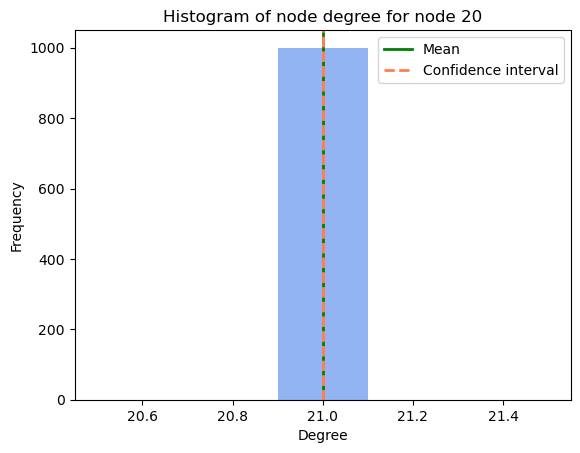

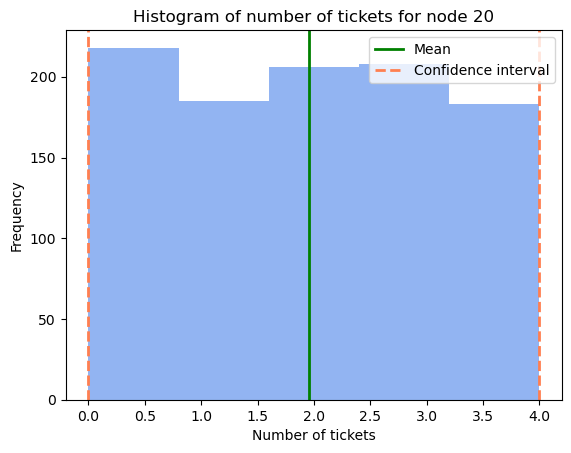

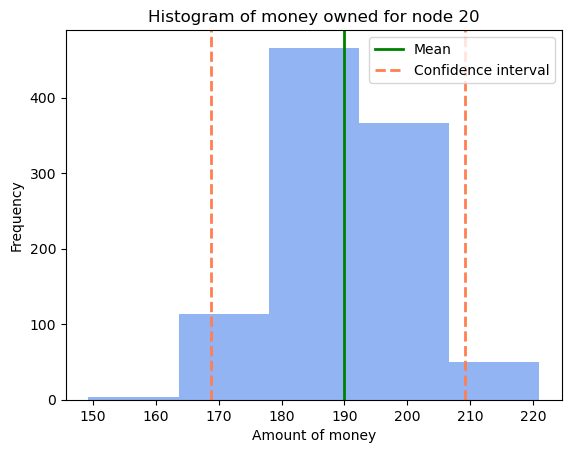

In [69]:
def calculate_95_confidence_interval(data):
    '''
    Code to calculate confidence interval for any data array,
    takes a data array as input and returns interval as output
    '''
    data_sorted = sorted(data)
    interval = np.percentile(data_sorted, 2.5), np.percentile(data_sorted, 97.5)
    return interval

degree_ci = calculate_95_confidence_interval(degrees)
tickets_ci = calculate_95_confidence_interval(tickets)
money_ci = calculate_95_confidence_interval(money)

def plot_histogram(data, ci, title, xlabel):
    '''
    Plot a histogram for the given data
    taking in data, intervals, titles, and labels
    and returns 3 histograms
    '''
    plt.figure()
    plt.hist(data, bins=5, alpha=0.7, color='cornflowerblue')
    plt.axvline(np.mean(data), color='green', linewidth=2, label="Mean")
    plt.axvline(ci[0], color='coral', linestyle='dashed', linewidth=2, label="Confidence interval")
    plt.axvline(ci[1], color='coral', linestyle='dashed', linewidth=2)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

plot_histogram(degrees, degree_ci, 'Histogram of node degree for node 20', 'Degree')
plot_histogram(tickets, tickets_ci, 'Histogram of number of tickets for node 20', 'Number of tickets')
plot_histogram(money, money_ci, 'Histogram of money owned for node 20', 'Amount of money')